In [1]:
# https://www.qmr.ai/yfinance-library-the-definitive-guide/
# https://www.linkedin.com/pulse/python-finance-part-1-yahoo-henry-meier
# https://stackoverflow.com/questions/30635145/create-multiple-dataframes-in-loop
# https://stackoverflow.com/questions/67361717/create-multiple-df-in-loop-based-on-condition
# https://finviz.com/
# https://tradewithpython.com/news-sentiment-analysis-using-python
# https://www.kaggle.com/code/faressayah/stock-market-analysis-prediction-using-lstm


## TMO and Competitor Stocks

Competitors: Biotechne, Danaher, Merck Group, and Qiagen

In [2]:
import pandas as pd
import yfinance as yf
from datetime import datetime
import plotly.express as px

from gnews import GNews
from datetime import datetime
from textsum.summarize import Summarizer
from tqdm import tqdm
import time

import warnings
warnings.filterwarnings('ignore')

In [3]:
end_date = datetime.now().strftime('%Y-%m-%d')
health_companies = ['TMO','TECH','DHR','MRK','QGEN'] 
tickers = yf.Tickers(health_companies)
tickers_hist = tickers.history(start='1997-01-01',end=end_date,interval='1d')
tickers_hist

[*********************100%***********************]  5 of 5 completed


Close                                                \
                   DHR         MRK       QGEN       TECH         TMO   
Date                                                                   
1997-01-02    3.530508   15.213660   3.154726   1.322400   32.096897   
1997-01-03    3.501569   15.737449   3.178038   1.322400   32.507076   
1997-01-06    3.482278   15.785066   3.232429   1.322400   31.686701   
1997-01-07    3.530508   15.808877   3.294591   1.388520   31.276533   
1997-01-08    3.530508   15.618395   3.418916   1.348848   31.276533   
...                ...         ...        ...        ...         ...   
2023-10-09  218.100418  104.500000  39.860001  67.940002  496.130005   
2023-10-10  218.440002  103.610001  40.419998  69.410004  496.149994   
2023-10-11  216.429993  103.459999  40.000000  69.290001  492.630005   
2023-10-12  209.490005  103.589996  39.070000  68.199997  482.559998   
2023-10-13  209.429993  104.010002  38.459999  67.790001  482.850006   

           Dividends                      ... Stock Splits                 \
                 DHR  MRK QGEN TECH  TMO  ...          DHR  MRK QGEN TECH   
Date                                      ...                               
1997-01-02      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
1997-01-03      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
1997-01-06      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
1997-01-07      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
1997-01-08      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
...              ...  ...  ...  ...  ...  ...          ...  ...  ...  ...   
2023-10-09      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
2023-10-10      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
2023-10-11      0.27  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
2023-10-12      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   
2023-10-13      0.00  0.0  0.0  0.0  0.0  ...          0.0  0.0  0.0  0.0   

                  Volume                                      
            TMO      DHR      MRK     QGEN     TECH      TMO  
Date                                                          
1997-01-02  0.0   898651  5675758   116210   104000  3362700  
1997-01-03  0.0   410642  4621470   504858   155200   906900  
1997-01-06  0.0   786766  7512693   278595   193600   844000  
1997-01-07  0.0   859372  5039832   608754   211200  1104200  
1997-01-08  0.0   776053  4884728   191630   209600   415900  
...         ...      ...      ...      ...      ...      ...  
2023-10-09  0.0  1949400  5061100  1447700   496200  1182500  
2023-10-10  0.0  2215500  7177200   839300   760900  1304900  
2023-10-11  0.0  2444900  5375100   717100   504600  1207100  
2023-10-12  0.0  5081600  5124000  1255800  1306700  2026200  
2023-10-13  0.0  3365600  5787500  1513000   624000  2004300  

[6741 rows x 35 columns]

In [4]:
tickers_hist=tickers_hist.stack(level=1).rename_axis(['Date', 'Ticker']).reset_index(level=1)
tickers_hist=tickers_hist.reset_index()
tickers_hist

,Date,Ticker,Close,Dividends,High,Low,Open,Stock Splits,Volume
0,1997-01-02,DHR,3.530508,0.0,3.559447,3.520862,3.559447,0.0,898651
1,1997-01-02,MRK,15.213660,0.0,15.213660,14.856532,15.166042,0.0,5675758
2,1997-01-02,QGEN,3.154726,0.0,3.185808,3.092565,3.185808,0.0,116210
3,1997-01-02,TECH,1.322400,0.0,1.375296,1.322400,1.335624,0.0,104000
4,1997-01-02,TMO,32.096897,0.0,33.224903,31.686713,33.224903,0.0,3362700
...,...,...,...,...,...,...,...,...,...
33700,2023-10-13,DHR,209.429993,0.0,211.929993,208.940002,209.740005,0.0,3365600
33701,2023-10-13,MRK,104.010002,0.0,104.519997,102.779999,103.610001,0.0,5787500
33702,2023-10-13,QGEN,38.459999,0.0,38.750000,38.139999,38.209999,0.0,1513000
33703,2023-10-13,TECH,67.790001,0.0,68.800003,67.489998,67.889999,0.0,624000


In [5]:
fig = px.line(x=tickers_hist['Date'], y=tickers_hist['Close'],color=tickers_hist['Ticker'])

# Customize the plot further if needed
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Value')

# Show the plot
fig.show()

## Healthcare ETF

In [6]:
# https://www.sectorspdrs.com/mainfund/xlv
# https://fintel.io/soe/us/tmo

In [7]:
etfs = ['IVV','XLV','IHI']
etf_tickers = yf.Tickers(etfs)
etf_tickers_hist = etf_tickers.history(start='1997-01-01',end=end_date,interval='1d')
etf_tickers_hist

[*********************100%***********************]  3 of 3 completed


Capital Gains                Close                          \
                     IHI  IVV  XLV        IHI         IVV         XLV   
Date                                                                    
1998-12-22           NaN  NaN  0.0        NaN         NaN   17.505877   
1998-12-23           NaN  NaN  0.0        NaN         NaN   17.899269   
1998-12-24           NaN  NaN  0.0        NaN         NaN   18.008543   
1998-12-28           NaN  NaN  0.0        NaN         NaN   17.746286   
1998-12-29           NaN  NaN  0.0        NaN         NaN   18.139679   
...                  ...  ...  ...        ...         ...         ...   
2023-10-09           0.0  0.0  0.0  47.869999  434.209991  130.460007   
2023-10-10           0.0  0.0  0.0  48.639999  436.480011  131.080002   
2023-10-11           0.0  0.0  0.0  46.389999  438.329987  130.500000   
2023-10-12           0.0  0.0  0.0  44.830002  435.700012  129.380005   
2023-10-13           0.0  0.0  0.0  45.369999  433.410004  130.190002   

           Dividends                 High  ...         Low       Open  \
                 IHI  IVV  XLV        IHI  ...         XLV        IHI   
Date                                       ...                          
1998-12-22       NaN  NaN  0.0        NaN  ...   17.352891        NaN   
1998-12-23       NaN  NaN  0.0        NaN  ...   17.615154        NaN   
1998-12-24       NaN  NaN  0.0        NaN  ...   17.844630        NaN   
1998-12-28       NaN  NaN  0.0        NaN  ...   17.746286        NaN   
1998-12-29       NaN  NaN  0.0        NaN  ...   17.746288        NaN   
...              ...  ...  ...        ...  ...         ...        ...   
2023-10-09       0.0  0.0  0.0  47.919998  ...  129.130005  47.720001   
2023-10-10       0.0  0.0  0.0  48.910000  ...  129.970001  47.939999   
2023-10-11       0.0  0.0  0.0  48.459999  ...  129.919998  48.360001   
2023-10-12       0.0  0.0  0.0  46.500000  ...  129.279999  46.439999   
2023-10-13       0.0  0.0  0.0  45.549999  ...  129.460007  44.750000   

                                   Stock Splits               Volume  \
                   IVV         XLV          IHI  IVV  XLV        IHI   
Date                                                                   
1998-12-22         NaN   17.352891          NaN  NaN  0.0        NaN   
1998-12-23         NaN   17.615154          NaN  NaN  0.0        NaN   
1998-12-24         NaN   17.921123          NaN  NaN  0.0        NaN   
1998-12-28         NaN   17.953909          NaN  NaN  0.0        NaN   
1998-12-29         NaN   17.746288          NaN  NaN  0.0        NaN   
...                ...         ...          ...  ...  ...        ...   
2023-10-09  429.450012  129.649994          0.0  0.0  0.0   654300.0   
2023-10-10  434.890015  130.419998          0.0  0.0  0.0   994800.0   
2023-10-11  437.630005  131.240005          0.0  0.0  0.0  4231100.0   
2023-10-12  438.910004  130.600006          0.0  0.0  0.0  4152700.0   
2023-10-13  437.179993  129.860001          0.0  0.0  0.0  2809200.0   

                                 
                  IVV       XLV  
Date                             
1998-12-22        NaN      5700  
1998-12-23        NaN     18100  
1998-12-24        NaN      4900  
1998-12-28        NaN     15500  
1998-12-29        NaN      5300  
...               ...       ...  
2023-10-09  2675500.0   8047600  
2023-10-10  4430000.0   8154900  
2023-10-11  3875600.0   9591800  
2023-10-12  4232300.0  10927700  
2023-10-13  4041200.0  11383800  

[6243 rows x 24 columns]

In [8]:
etf_tickers_hist=etf_tickers_hist.stack(level=1).rename_axis(['Date', 'Ticker']).reset_index(level=1)
etf_tickers_hist=etf_tickers_hist.reset_index()
etf_tickers_hist

,Date,Ticker,Capital Gains,Close,Dividends,High,Low,Open,Stock Splits,Volume
0,1998-12-22,XLV,0.0,17.505877,0.0,17.527732,17.352891,17.352891,0.0,5700.0
1,1998-12-23,XLV,0.0,17.899269,0.0,17.899269,17.615154,17.615154,0.0,18100.0
2,1998-12-24,XLV,0.0,18.008543,0.0,18.008543,17.844630,17.921123,0.0,4900.0
3,1998-12-28,XLV,0.0,17.746286,0.0,18.008547,17.746286,17.953909,0.0,15500.0
4,1998-12-29,XLV,0.0,18.139679,0.0,18.139679,17.746288,17.746288,0.0,5300.0
...,...,...,...,...,...,...,...,...,...,...
16517,2023-10-12,IVV,0.0,435.700012,0.0,439.279999,433.170013,438.910004,0.0,4232300.0
16518,2023-10-12,XLV,0.0,129.380005,0.0,130.850006,129.279999,130.600006,0.0,10927700.0
16519,2023-10-13,IHI,0.0,45.369999,0.0,45.549999,44.660000,44.750000,0.0,2809200.0
16520,2023-10-13,IVV,0.0,433.410004,0.0,438.380005,431.790009,437.179993,0.0,4041200.0


In [9]:
fig = px.line(x=etf_tickers_hist['Date'], y=etf_tickers_hist['Close'],color=etf_tickers_hist['Ticker'])

# Customize the plot further if needed
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Value')

# Show the plot
fig.show()

In [10]:
# https://www.geeksforgeeks.org/python-plotly-how-to-set-up-a-color-palette/

In [11]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

# Add traces to the subplots for stocks
for ticker, color in zip(health_companies, px.colors.qualitative.Plotly):
    subset = tickers_hist[tickers_hist['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=ticker, line=dict(color=color)),
        row=1, col=1
    )

# Add traces to the subplots for ETFs
for ticker, color in zip(etfs, px.colors.qualitative.Safe):
    subset = etf_tickers_hist[etf_tickers_hist['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=ticker, line=dict(color=color)),
        row=1, col=2
    )

# Update layout
fig.update_layout(
    title='Stock and ETF Comparison',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close Price'),
    legend=dict(
        bgcolor='rgba(255, 255, 255, 0.5)',  # Set a semi-transparent white background
        bordercolor='rgba(0, 0, 0, 0.2)',    # Set a border color
        borderwidth=1,                        # Set a border width
        font=dict(
            family='Arial',                  # Specify font family
            size=24,                         # Specify font size
            color='black'                    # Specify font color
        )
    )
)

# Show the plot
fig.show()


In [12]:
start_date="2022-01-01"
# start_date="2022-01-01"
end_date="2023-08-30"

In [13]:
tickers_hist_date=tickers_hist[(tickers_hist['Date']>start_date)&(tickers_hist['Date']<=end_date)]

In [14]:
etf_tickers_hist_date=etf_tickers_hist[(etf_tickers_hist['Date']>start_date)&(etf_tickers_hist['Date']<=end_date)]

In [15]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

# Add traces to the subplots for stocks
for ticker, color in zip(health_companies, px.colors.qualitative.Plotly):
    subset = tickers_hist_date[tickers_hist_date['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=ticker, line=dict(color=color)),
        row=1, col=1
    )

# Add traces to the subplots for ETFs
for ticker, color in zip(etfs, px.colors.qualitative.Safe):
    subset = etf_tickers_hist_date[etf_tickers_hist_date['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=ticker, line=dict(color=color)),
        row=1, col=2
    )

# Update layout
fig.update_layout(
    title='Stock and ETF Comparison',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close Price'),
    legend=dict(
        bgcolor='rgba(255, 255, 255, 0.5)',  # Set a semi-transparent white background
        bordercolor='rgba(0, 0, 0, 0.2)',    # Set a border color
        borderwidth=1,                        # Set a border width
        font=dict(
            family='Arial',                  # Specify font family
            size=24,                         # Specify font size
            color='black'                    # Specify font color
        )
    )
)

# Show the plot
fig.show()


In [16]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots with 1 row and 1 column
fig = go.Figure()

# Add traces for stocks
for ticker, color in zip(health_companies, px.colors.qualitative.Plotly):
    subset = tickers_hist_date[tickers_hist_date['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=f'Stocks: {ticker}', line=dict(color=color, dash='solid')),
    )

# Add traces for ETFs
for ticker, color in zip(etfs, px.colors.qualitative.Safe):
    subset = etf_tickers_hist_date[etf_tickers_hist_date['Ticker'] == ticker]
    fig.add_trace(
        go.Scatter(x=subset['Date'], y=subset['Close'], mode='lines', name=f'ETFs: {ticker}', line=dict(color=color, dash='dash')),
    )

# Update layout
fig.update_layout(
    title='Stock and ETF Comparison',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close Price'),
    legend=dict(
        bgcolor='rgba(255, 255, 255, 0.5)',  # Set a semi-transparent white background
        bordercolor='rgba(0, 0, 0, 0.2)',    # Set a border color
        borderwidth=1,                        # Set a border width
        font=dict(
            family='Arial',                  # Specify font family
            size=14,                         # Specify font size
            color='black'                    # Specify font color
        ),
        itemsizing='constant'                # Keep legend item size constant
    )
)


# Show the plot
fig.show()


## Text Data

In [ ]:
summarizer = Summarizer()
google_news = GNews(language='en', country='US', start_date=(2022, 1, 1),end_date=(2023, 8, 30),
                    max_results=100, exclude_websites=['www.seattletimes.com','www.fiercepharma.com'])


In [17]:
def news_df(search,stock_ticker,google_news):
    
    title_list = []
    article_sum = []
    published_date = []
    article_link=[]
    stock_news_df = google_news.get_news(search)
    
    for i in stock_news_df:
        try:
            article = google_news.get_full_article(i['url'])
        except:
            article = google_news.get_full_article("Error")
        try:
            article_link.append(i['url'])
        except:
            article_link.append("Error")
    #         title_list.append(article.title)
        try:
            title_list.append(i['title'])
        except:
            title_list.append("Error")
        try:
            article_sum.append(summarizer.summarize_string(article.text))
        except:
            article_sum.append("Error")
        try:
            parsed_date = datetime.strptime(i['published date'], "%a, %d %b %Y %H:%M:%S GMT")
            published_date.append(parsed_date.strftime("%Y-%m-%d"))
        except:
#             parsed_date = datetime.strptime(i['published date'], "%a, %d %b %Y %H:%M:%S GMT")
            published_date.append("Error")

    # Create a DataFrame from the lists
    news_data = {
        'Title': title_list,
        'Summary': article_sum,
        'Published Date': published_date,
        'Stock Name': stock_ticker,
        'URL': article_link
    }
    
    df = pd.DataFrame(news_data)
    time.sleep(10)
    return df

In [17]:
health_stocks=['Thermo Fisher Scientific','Bio-Techne','Danaher','Merck','QIAGEN'] 

In [ ]:
for health_ticker,health in tqdm(zip(health_companies,health_stocks)):
    if health=='Thermo Fisher Scientific':
        thermo_news_df=news_df('Thermo Fisher Scientific',health_ticker,google_news)
#     if health=='Bio-Techne':
#         biotechne_news_df=news_df(health,health_ticker)
#     if health=='Danaher':
#         danaher_news_df=news_df(health,health_ticker)
#     if health=='Merck':
#         merck_news_df=news_df(health,health_ticker)
#     if health=='QIAGEN':
#         qiagen_news_df=news_df(health,health_ticker)

In [ ]:
thermo_news_df

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [ ]:

def perform_sentiment_analysis(df):
    # Initialize the VADER sentiment analyzer
    analyzer = SentimentIntensityAnalyzer()

    # Create a list to store the sentiment scores
    sentiment_scores = []

    for index, row in df.iterrows():
        summary = row['Summary']
        sentiment_score = analyzer.polarity_scores(summary)
        sentiment_scores.append(sentiment_score)

    # Convert the list of sentiment scores into a DataFrame
    sentiment_df = pd.DataFrame(sentiment_scores)

    # Concatenate the sentiment DataFrame with the original data
    result_data = pd.concat([df, sentiment_df], axis=1)

    return result_data

thermo_news_df_s = perform_sentiment_analysis(thermo_news_df)

In [ ]:
thermo_news_df_s

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS

In [19]:
#Sentiment Analysis
def percentage(part,whole):
    return 100 * float(part)/float(whole)

#Assigning Initial Values
positive = 0
negative = 0
neutral = 0
#Creating empty lists
news_list = []
neutral_list = []
negative_list = []
positive_list = []
sentiment = []

#Iterating over the tweets in the dataframe
for news in thermo_news_df['Summary']:
    news_list.append(news)
    analyzer = SentimentIntensityAnalyzer().polarity_scores(news)
    neg = analyzer['neg']
    neu = analyzer['neu']
    pos = analyzer['pos']
    comp = analyzer['compound']

    if neg > pos:
        negative_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Negative")
        negative += 1 #increasing the count by 1
    elif pos > neg:
        positive_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Positive")
        positive += 1 #increasing the count by 1
    elif pos == neg:
        neutral_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Neutral")
        neutral += 1 #increasing the count by 1
        
    sentiment_df = pd.DataFrame(sentiment, columns=['sentiment'])
        
    thermo_news_df_s = pd.concat([thermo_news_df, sentiment_df], axis=1)
    
positive = percentage(positive, len(thermo_news_df)) #percentage is the function defined above
negative = percentage(negative, len(thermo_news_df))
neutral = percentage(neutral, len(thermo_news_df))

news_list = pd.DataFrame(news_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
print("Positive Sentiment:", '%.2f' % len(positive_list), end='\n')
print("Neutral Sentiment:", '%.2f' % len(neutral_list), end='\n')
print("Negative Sentiment:", '%.2f' % len(negative_list), end='\n')

#Creating PieCart
labels = ['Positive ['+str(round(positive))+'%]' , 'Neutral ['+str(round(neutral))+'%]','Negative ['+str(round(negative))+'%]']
sizes = [positive, neutral, negative]
colors = ['yellowgreen', 'blue','red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result for stock= Thermofisher" )
plt.axis('equal')
plt.show()

# Word cloud visualization
def word_cloud(text):
    stopwords = set(STOPWORDS)
    allWords = ' '.join([nws for nws in text])
    wordCloud = WordCloud(background_color='black',width = 1600, height = 800,stopwords = stopwords,min_font_size = 20,max_font_size=150,colormap='prism').generate(allWords)
    fig, ax = plt.subplots(figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud)
    ax.axis("off")
    fig.tight_layout(pad=0)
    plt.show()

print('Wordcloud for ' + "Thermofisher")
word_cloud(thermo_news_df['Summary'].values)


NameError: name 'thermo_news_df' is not defined

In [ ]:
thermo_news_df_s.columns

In [ ]:
print('Wordcloud for ' + "Thermofisher")
word_cloud(thermo_news_df_s[thermo_news_df_s['sentiment']=="Negative"]['Summary'].values)

In [ ]:
print('Wordcloud for ' + "Thermofisher")
word_cloud(thermo_news_df_s[thermo_news_df_s['sentiment']=="Positive"]['Summary'].values)

### Sentiment Analyis Quarter wise

In [17]:
def news_df(search,stock_ticker,google_news):
    print(search,stock_ticker,google_news)
    title_list = []
    article_sum = []
    published_date = []
    article_link=[]
    stock_news_df = google_news.get_news(search)
    
    for i in stock_news_df:
        try:
            article = google_news.get_full_article(i['url'])
            print("--",article)
        except:
            article = google_news.get_full_article("Error")
        try:
            article_link.append(i['url'])
        except:
            article_link.append("Error")
    #         title_list.append(article.title)
        try:
            title_list.append(i['title'])
        except:
            title_list.append("Error")
        try:
            article_sum.append(summarizer.summarize_string(article.text))
        except:
            article_sum.append("Error")
        try:
            parsed_date = datetime.strptime(i['published date'], "%a, %d %b %Y %H:%M:%S GMT")
            published_date.append(parsed_date.strftime("%Y-%m-%d"))
        except:
#             parsed_date = datetime.strptime(i['published date'], "%a, %d %b %Y %H:%M:%S GMT")
            published_date.append("Error")

    # Create a DataFrame from the lists
    news_data = {
        'Title': title_list,
        'Summary': article_sum,
        'Published Date': published_date,
        'Stock Name': stock_ticker,
        'URL': article_link
    }
    
    df = pd.DataFrame(news_data)
    print(df)
    time.sleep(10)
    return df

## For all of the quarters Sentiment

In [18]:
from datetime import datetime

def convert_dates(start_dates, end_dates):
    formatted_start_dates = []
    formatted_end_dates = []
    
    for start_date_str, end_date_str in zip(start_dates, end_dates):
        start_date = datetime.strptime(start_date_str, "%m-%d-%Y")
        end_date = datetime.strptime(end_date_str, "%m-%d-%Y")
        
        formatted_start_dates.append((start_date.year, start_date.month, start_date.day))
        formatted_end_dates.append((end_date.year, end_date.month, end_date.day))
    
    return formatted_start_dates, formatted_end_dates

start_date_str = ["01-01-2022", "04-01-2022", "07-01-2022", "10-01-2022", "01-01-2023", "04-01-2023", "07-01-2023"]
end_date_str = ["03-31-2022", "06-30-2022", "09-30-2022", "12-31-2022", "03-31-2023", "06-30-2023", "09-30-2023"]

formatted_start_dates, formatted_end_dates = convert_dates(start_date_str, end_date_str)

print("Formatted Start Dates:", formatted_start_dates)
print("Formatted End Dates:", formatted_end_dates)


Formatted Start Dates: [(2022, 1, 1), (2022, 4, 1), (2022, 7, 1), (2022, 10, 1), (2023, 1, 1), (2023, 4, 1), (2023, 7, 1)]
Formatted End Dates: [(2022, 3, 31), (2022, 6, 30), (2022, 9, 30), (2022, 12, 31), (2023, 3, 31), (2023, 6, 30), (2023, 9, 30)]


In [19]:
google_news_list = []
for i, (start, end) in enumerate(zip(formatted_start_dates, formatted_end_dates)):
    gnews = GNews(language='en', country='US', start_date=start, end_date=end,
                  max_results=1, exclude_websites=['www.seattletimes.com', 'www.fiercepharma.com','www.governor.virginia.gov'])
    
    # Append the GNews object to the list
    google_news_list.append(gnews)


In [20]:
health_stocks=['Thermo Fisher Scientific'] 

In [21]:
summarizer = Summarizer()
thermo_news_df_quarter = pd.DataFrame()

for gns in google_news_list:
    for health_ticker, health in tqdm(zip(health_companies, health_stocks)):
        if health == 'Thermo Fisher Scientific':
            thermo_news_df_quarter = pd.concat([thermo_news_df_quarter, news_df('Thermo Fisher Scientific', health_ticker, gns)])


10/16/2023 10:16:26 AM - Loaded model pszemraj/long-t5-tglobal-base-16384-book-summary to cpu
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8b715fc10>
Empty DataFrame
Columns: [Title, Summary, Published Date, Stock Name, URL]
Index: []


1it [00:11, 11.23s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8b715fca0>
-- <newspaper.article.Article object at 0x7fb827f85fd0>


Generating Summaries:   0%|          | 0/1 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher inaugurates $44M plant, boosting...   

                                             Summary Published Date  \
0  A ribbon cutting ceremony is held for the new ...     2022-04-20   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMidWh0d...  


1it [00:26, 26.49s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8b715fd30>
-- <newspaper.article.Article object at 0x7fb893019520>


Generating Summaries:   0%|          | 0/4 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher Scientific Reports Second Quarte...   

                                             Summary Published Date  \
0  Second quarter 2022 Earnings Per share of $4.2...     2022-07-28   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMikgFod...  


1it [01:20, 80.60s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8a13b76d0>
-- <newspaper.article.Article object at 0x7fb8a1b9bdc0>


Generating Summaries:   0%|          | 0/4 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher Scientific Reports Third Quarter...   

                                             Summary Published Date  \
0  Third quarter 2022 revenue is $10.68 Billion, ...     2022-10-26   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMihQFod...  


1it [01:26, 86.92s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8a13b72e0>
-- <newspaper.article.Article object at 0x7fb8b73ecac0>


Generating Summaries:   0%|          | 0/4 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher Scientific Reports Fourth Quarte...   

                                             Summary Published Date  \
0  TMO reports its fourth-quarter and full year r...     2023-02-01   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMilAFod...  


1it [02:11, 131.08s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8a13b7760>
-- <newspaper.article.Article object at 0x7fb8a1d78fa0>


Generating Summaries:   0%|          | 0/3 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher Scientific Reports First Quarter...   

                                             Summary Published Date  \
0  First quarter revenue for the year is $10.71 B...     2023-04-26   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMihQFod...  


1it [01:03, 63.65s/it]
0it [00:00, ?it/s]

Thermo Fisher Scientific TMO <gnews.gnews.GNews object at 0x7fb8a13b7460>
-- <newspaper.article.Article object at 0x7fb8b6d31bb0>


Generating Summaries:   0%|          | 0/1 [00:00<?, ?it/s]

                                               Title  \
0  Thermo Fisher Scientific settles with family o...   

                                             Summary Published Date  \
0  The family has settled a lawsuit with a Massac...     2023-08-01   

  Stock Name                                                URL  
0        TMO  https://news.google.com/rss/articles/CBMikQFod...  


1it [00:44, 44.80s/it]


In [29]:
thermo_news_df_quarter=thermo_news_df_quarter.reset_index()

In [36]:
thermo_news_df_quarter['Published Date']=pd.to_datetime(thermo_news_df_quarter['Published Date'])

In [37]:
thermo_news_df_quarter['quarter']=thermo_news_df_quarter['Published Date'].dt.quarter

In [38]:
thermo_news_df_quarter

,index,Title,Summary,Published Date,Stock Name,URL,quarter
0,0,"Thermo Fisher inaugurates $44M plant, boosting...",A ribbon cutting ceremony is held for the new ...,2022-04-20,TMO,https://news.google.com/rss/articles/CBMidWh0d...,2
1,0,Thermo Fisher Scientific Reports Second Quarte...,Second quarter 2022 Earnings Per share of $4.2...,2022-07-28,TMO,https://news.google.com/rss/articles/CBMikgFod...,3
2,0,Thermo Fisher Scientific Reports Third Quarter...,"Third quarter 2022 revenue is $10.68 Billion, ...",2022-10-26,TMO,https://news.google.com/rss/articles/CBMihQFod...,4
3,0,Thermo Fisher Scientific Reports Fourth Quarte...,TMO reports its fourth-quarter and full year r...,2023-02-01,TMO,https://news.google.com/rss/articles/CBMilAFod...,1
4,0,Thermo Fisher Scientific Reports First Quarter...,First quarter revenue for the year is $10.71 B...,2023-04-26,TMO,https://news.google.com/rss/articles/CBMihQFod...,2
5,0,Thermo Fisher Scientific settles with family o...,The family has settled a lawsuit with a Massac...,2023-08-01,TMO,https://news.google.com/rss/articles/CBMikQFod...,3


In [30]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import matplotlib.pyplot as plt
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS

Positive Sentiment: 5.00
Neutral Sentiment: 0.00
Negative Sentiment: 1.00


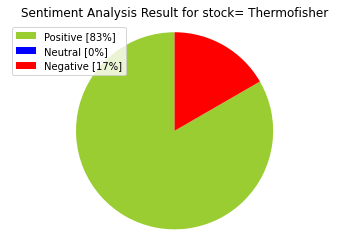

Wordcloud for Thermofisher


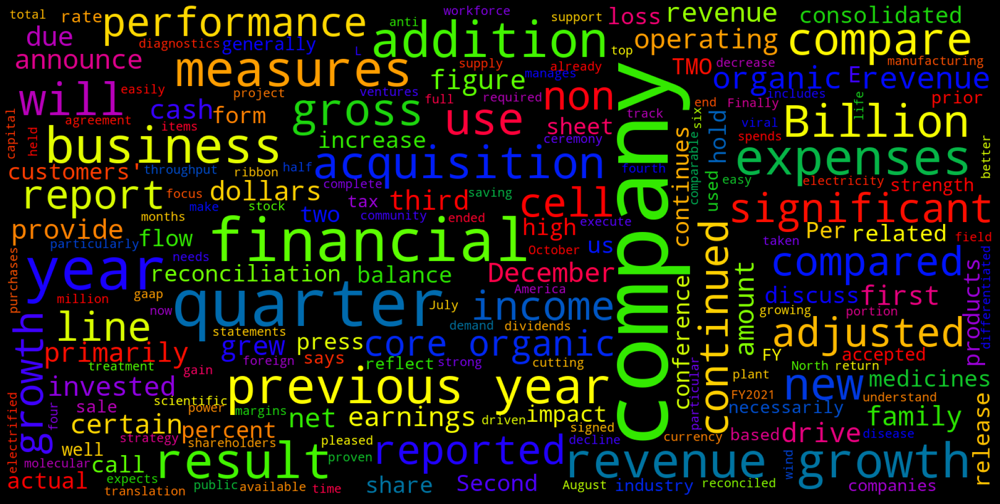

In [32]:
#Sentiment Analysis
def percentage(part,whole):
    return 100 * float(part)/float(whole)

#Assigning Initial Values
positive = 0
negative = 0
neutral = 0
#Creating empty lists
news_list = []
neutral_list = []
negative_list = []
positive_list = []
sentiment = []

#Iterating over the tweets in the dataframe
for news in thermo_news_df_quarter['Summary']:
    
    news_list.append(news)
    analyzer = SentimentIntensityAnalyzer().polarity_scores(news)
    neg = analyzer['neg']
    neu = analyzer['neu']
    pos = analyzer['pos']
    comp = analyzer['compound']

    if neg > pos:
        negative_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Negative")
        negative += 1 #increasing the count by 1
    elif pos > neg:
        positive_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Positive")
        positive += 1 #increasing the count by 1
    elif pos == neg:
        neutral_list.append(news) #appending the news that satisfies this condition
        sentiment.append("Neutral")
        neutral += 1 #increasing the count by 1
        
    sentiment_df = pd.DataFrame(sentiment, columns=['sentiment'])
        
    thermo_news_df_s = pd.concat([thermo_news_df_quarter, sentiment_df], axis=1)
    
positive = percentage(positive, len(thermo_news_df_quarter)) #percentage is the function defined above
negative = percentage(negative, len(thermo_news_df_quarter))
neutral = percentage(neutral, len(thermo_news_df_quarter))

news_list = pd.DataFrame(news_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
print("Positive Sentiment:", '%.2f' % len(positive_list), end='\n')
print("Neutral Sentiment:", '%.2f' % len(neutral_list), end='\n')
print("Negative Sentiment:", '%.2f' % len(negative_list), end='\n')

#Creating PieCart
labels = ['Positive ['+str(round(positive))+'%]' , 'Neutral ['+str(round(neutral))+'%]','Negative ['+str(round(negative))+'%]']
sizes = [positive, neutral, negative]
colors = ['yellowgreen', 'blue','red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result for stock= Thermofisher" )
plt.axis('equal')
plt.show()

# Word cloud visualization
def word_cloud(text):
    stopwords = set(STOPWORDS)
    allWords = ' '.join([nws for nws in text])
    wordCloud = WordCloud(background_color='black',width = 1600, height = 800,stopwords = stopwords,min_font_size = 20,max_font_size=150,colormap='prism').generate(allWords)
    fig, ax = plt.subplots(figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud)
    ax.axis("off")
    fig.tight_layout(pad=0)
    plt.show()

print('Wordcloud for ' + "Thermofisher")
word_cloud(thermo_news_df_quarter['Summary'].values)


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from GoogleNews import GoogleNews
from newspaper import Article,Config
from wordcloud import WordCloud, STOPWORDS

# nltk.download('vader_lexicon') #required for Sentiment Analysis

In [29]:
start_date="2020-01-01"
# start_date="2022-01-01"
end_date="2023-08-30"
# end_date = now.strftime('%Y-%m-%d')

user_agent = 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10.15; rv:78.0) Gecko/20100101 Firefox/78.0'
config = Config()
config.browser_user_agent = user_agent
config.request_timeout = 10


In [ ]:
# https://www.reddit.com/r/learnpython/comments/16htbtl/helpinsight_with_scraping_news_articles_from_a/
# https://bobbyhadz.com/blog/python-error-in-package-setup-command-use-2to3-is-invalid
# https://medium.datadriveninvestor.com/sentiment-analysis-of-stocks-from-financial-news-using-python-82ebdcefb638

# https://towardsdatascience.com/stock-news-sentiment-analysis-with-python-193d4b4378d4

# Not used:
# https://github.com/santhoshse7en/news-fetch
# https://python.plainenglish.io/coding-methodology-stock-news-web-crawler-with-python-the-star-19c7586d7fd0
# https://colab.research.google.com/drive/11cDSK88OawBiw6mwN7eZhV4SrbcNy6ZN?usp=sharing#scrollTo=5h4u7v0JK9Fd

## Not needed

In [ ]:
# from pygooglenews import GoogleNews
# gn = GoogleNews()
# tmo_news = gn.search('Thermofisher', when="1y")
# titles=[item['title'] for item in tmo_news['entries']]
# published=[item['published'] for item in tmo_news['entries']]

# print(tmo_news['feed'].title)

In [16]:
healthetfs = health_companies + etfs
ticker_list_method=[]
for ticker in healthetfs:
    ticker_list_method.append(yf.Ticker(ticker))

In [ ]:
# https://www.askpython.com/python/examples/find-all-methods-of-class

In [18]:
# Get the list of non-private methods for the yf(test) object
tsla = yf.Ticker('TSLA')
method_list = [method for method in dir(tsla) if not method.startswith('_')]

# Loop through each method and print the result if available
for stock in ticker_list_method:
    print("Ticker:",stock)
    for method_name in method_list:
        try:
            method = getattr(stock, method_name)  # Get the method from the object
            result = method()  # Call the method
            print(f"Method: {method_name}")
            print(result)
            print("\n" + "=" * 50 + "\n")  # Separation between method results
        except Exception as e:
            pass
#         print(f"Error in method {method_name}: {str(e)}\n")

Ticker: yfinance.Ticker object <TMO>
Method: get_actions
                           Dividends  Stock Splits
Date                                              
1984-01-04 00:00:00-05:00   0.000000           1.5
1985-09-17 00:00:00-04:00   0.000000           1.5
1986-11-03 00:00:00-05:00   0.000000           1.5
1993-08-06 00:00:00-04:00   0.042963           0.0
1993-10-29 00:00:00-04:00   0.000000           1.5
1995-05-25 00:00:00-04:00   0.000000           1.5
1996-01-25 00:00:00-05:00   0.004000           0.0
1996-06-06 00:00:00-04:00   0.000000           1.5
2001-08-09 00:00:00-04:00   0.820000           0.0
2001-11-16 00:00:00-05:00   2.520000           0.0
2012-03-13 00:00:00-04:00   0.130000           0.0
2012-06-13 00:00:00-04:00   0.130000           0.0
2012-09-13 00:00:00-04:00   0.130000           0.0
2012-12-13 00:00:00-05:00   0.150000           0.0
2013-03-13 00:00:00-04:00   0.150000           0.0
2013-06-13 00:00:00-04:00   0.150000           0.0
2013-09-12 00:00:00-04:00

Method: get_shares_full
2022-04-09 00:00:00-04:00    391439008
2022-04-11 00:00:00-04:00    391439008
2022-05-10 00:00:00-04:00    391462016
2022-08-10 00:00:00-04:00    391788992
2022-09-02 00:00:00-04:00    391788992
2022-10-21 00:00:00-04:00    406878016
2022-10-23 00:00:00-04:00    391788992
2022-11-09 00:00:00-05:00    392196000
2023-02-25 00:00:00-05:00    385430016
2023-03-18 00:00:00-04:00    392296000
2023-03-22 00:00:00-04:00    385430016
2023-03-30 00:00:00-04:00    386070016
2023-03-31 00:00:00-04:00    385430016
2023-04-04 00:00:00-04:00    389689984
2023-04-06 00:00:00-04:00    385430016
2023-04-08 00:00:00-04:00    385697984
2023-04-11 00:00:00-04:00    386363008
2023-04-11 00:00:00-04:00    385697984
2023-04-14 00:00:00-04:00    385430016
2023-04-14 00:00:00-04:00    385697984
2023-04-21 00:00:00-04:00    385430016
2023-04-22 00:00:00-04:00    385697984
2023-04-28 00:00:00-04:00    385697984
2023-05-09 00:00:00-04:00    385720992
2023-05-11 00:00:00-04:00    386560000
2

Ticker: yfinance.Ticker object <TECH>
Method: get_actions
                           Dividends  Stock Splits
Date                                              
1997-11-18 00:00:00-05:00     0.0000           2.0
2000-12-04 00:00:00-05:00     0.0000           2.0
2008-10-30 00:00:00-04:00     0.0625           0.0
2009-02-11 00:00:00-05:00     0.0625           0.0
2009-05-06 00:00:00-04:00     0.0625           0.0
...                              ...           ...
2022-11-10 00:00:00-05:00     0.0800           0.0
2022-11-30 00:00:00-05:00     0.0000           4.0
2023-02-10 00:00:00-05:00     0.0800           0.0
2023-05-12 00:00:00-04:00     0.0800           0.0
2023-08-17 00:00:00-04:00     0.0800           0.0

[63 rows x 2 columns]


Method: get_analyst_price_target
None


Method: get_calendar
None


Method: get_capital_gains
[]


Method: get_dividends
Date
2008-10-30 00:00:00-04:00    0.0625
2009-02-11 00:00:00-05:00    0.0625
2009-05-06 00:00:00-04:00    0.0625
2009-08-13 00:00:00-

Method: get_shares_full
2022-05-11 00:00:00-04:00     39233500
2022-07-29 00:00:00-04:00     39895700
2022-07-30 00:00:00-04:00     39233500
2022-08-26 00:00:00-04:00     39212000
2022-09-01 00:00:00-04:00     39212000
2022-09-02 00:00:00-04:00     39090700
2022-09-02 00:00:00-04:00     39212000
2022-09-16 00:00:00-04:00     39222600
2022-10-21 00:00:00-04:00     40319500
2022-10-23 00:00:00-04:00     39222600
2022-11-01 00:00:00-04:00     39323500
2022-11-02 00:00:00-04:00     39222600
2022-11-09 00:00:00-05:00     39242400
2022-12-05 00:00:00-05:00    156970000
2023-02-09 00:00:00-05:00    157275008
2023-03-07 00:00:00-05:00    157275008
2023-03-07 00:00:00-05:00    159995008
2023-03-08 00:00:00-05:00    157275008
2023-03-08 00:00:00-05:00    161668000
2023-03-30 00:00:00-04:00    158240992
2023-04-01 00:00:00-04:00    161096992
2023-04-02 00:00:00-04:00    157275008
2023-04-04 00:00:00-04:00    158192000
2023-04-06 00:00:00-04:00    157275008
2023-04-18 00:00:00-04:00    157275008
2

Ticker: yfinance.Ticker object <DHR>
Method: get_actions
                           Dividends  Stock Splits
Date                                              
1987-09-09 00:00:00-04:00   0.000000         2.000
1993-03-22 00:00:00-05:00   0.001422         0.000
1993-06-21 00:00:00-04:00   0.001422         0.000
1993-09-23 00:00:00-04:00   0.001422         0.000
1993-12-13 00:00:00-05:00   0.001422         0.000
...                              ...           ...
2022-09-29 00:00:00-04:00   0.250000         0.000
2022-12-29 00:00:00-05:00   0.250000         0.000
2023-03-30 00:00:00-04:00   0.270000         0.000
2023-06-29 00:00:00-04:00   0.270000         0.000
2023-10-02 00:00:00-04:00   0.000000         1.128

[129 rows x 2 columns]


Method: get_analyst_price_target
None


Method: get_calendar
None


Method: get_capital_gains
[]


Method: get_dividends
Date
1993-03-22 00:00:00-05:00    0.001422
1993-06-21 00:00:00-04:00    0.001422
1993-09-23 00:00:00-04:00    0.001422
1993-12-13 00:

Method: get_shares_full
2022-04-19 00:00:00-04:00    720865984
2022-04-19 00:00:00-04:00    715894976
2022-04-23 00:00:00-04:00    727076992
2022-04-25 00:00:00-04:00    727076992
2022-05-04 00:00:00-04:00    732958016
2022-05-06 00:00:00-04:00    727076992
2022-06-03 00:00:00-04:00    727076992
2022-06-03 00:00:00-04:00    761230016
2022-07-22 00:00:00-04:00    727444992
2022-07-29 00:00:00-04:00    750718976
2022-07-30 00:00:00-04:00    727444992
2022-09-02 00:00:00-04:00    727444992
2022-09-20 00:00:00-04:00    722542976
2022-09-21 00:00:00-04:00    727444992
2022-10-21 00:00:00-04:00    771766016
2022-10-23 00:00:00-04:00    727963008
2022-11-04 00:00:00-04:00    727963008
2022-11-04 00:00:00-04:00    731340032
2023-01-04 00:00:00-05:00    736705984
2023-01-05 00:00:00-05:00    727963008
2023-01-25 00:00:00-05:00    728300032
2023-02-04 00:00:00-05:00    730540032
2023-02-05 00:00:00-05:00    728300032
2023-02-24 00:00:00-05:00    728577024
2023-03-18 00:00:00-04:00    747708992
2

Ticker: yfinance.Ticker object <MRK>
Method: get_actions
                           Dividends  Stock Splits
Date                                              
1962-03-06 00:00:00-05:00   0.001767           0.0
1962-06-05 00:00:00-04:00   0.001767           0.0
1962-09-05 00:00:00-04:00   0.001767           0.0
1962-12-04 00:00:00-05:00   0.001988           0.0
1963-03-05 00:00:00-05:00   0.001988           0.0
...                              ...           ...
2022-09-14 00:00:00-04:00   0.690000           0.0
2022-12-14 00:00:00-05:00   0.730000           0.0
2023-03-14 00:00:00-04:00   0.730000           0.0
2023-06-14 00:00:00-04:00   0.730000           0.0
2023-09-14 00:00:00-04:00   0.730000           0.0

[251 rows x 2 columns]


Method: get_analyst_price_target
None


Method: get_calendar
None


Method: get_capital_gains
[]


Method: get_dividends
Date
1962-03-06 00:00:00-05:00    0.001767
1962-06-05 00:00:00-04:00    0.001767
1962-09-05 00:00:00-04:00    0.001767
1962-12-04 00:

Method: get_shares_full
2022-04-19 00:00:00-04:00    2528349952
2022-04-19 00:00:00-04:00    2553029888
2022-05-07 00:00:00-04:00    2528809984
2022-05-10 00:00:00-04:00    2528809984
2022-05-27 00:00:00-04:00    2568250112
2022-05-28 00:00:00-04:00    2528809984
2022-07-23 00:00:00-04:00    2529649920
2022-07-24 00:00:00-04:00    2528809984
2022-08-02 00:00:00-04:00    2551940096
2022-08-03 00:00:00-04:00    2528809984
2022-08-05 00:00:00-04:00    2552110080
2022-08-06 00:00:00-04:00    2533280000
2022-08-09 00:00:00-04:00    2533280000
2022-09-02 00:00:00-04:00    2533280000
2022-10-21 00:00:00-04:00    2542000128
2022-10-22 00:00:00-04:00    2533280000
2022-11-05 00:00:00-04:00    2535399936
2022-11-08 00:00:00-05:00    2533280000
2022-11-10 00:00:00-05:00    2535399936
2022-12-03 00:00:00-05:00    2535399936
2022-12-04 00:00:00-05:00    2535399936
2023-02-28 00:00:00-05:00    2538589952
2023-03-01 00:00:00-05:00    2538589952
2023-04-06 00:00:00-04:00    2537690112
2023-04-15 00:00

Ticker: yfinance.Ticker object <QGEN>
Method: get_actions
                           Dividends  Stock Splits
Date                                              
1999-07-16 00:00:00-04:00   0.000000         2.000
2000-07-14 00:00:00-04:00   0.000000         4.000
2002-12-26 00:00:00-05:00   0.002079         0.000
2002-12-27 00:00:00-05:00   0.028067         0.000
2017-01-25 00:00:00-05:00   1.087000         0.962


Method: get_analyst_price_target
None


Method: get_calendar
None


Method: get_capital_gains
[]


Method: get_dividends
Date
2002-12-26 00:00:00-05:00    0.002079
2002-12-27 00:00:00-05:00    0.028067
2017-01-25 00:00:00-05:00    1.087000
Name: Dividends, dtype: float64


Method: get_earnings
Empty DataFrame
Columns: []
Index: []


Method: get_earnings_dates
                           EPS Estimate  Reported EPS  Surprise(%)
Earnings Date                                                     
2024-08-06 16:00:00-04:00           NaN           NaN          NaN
2024-05-01 10:00:00-

Method: get_shares_full
2022-04-30 00:00:00-04:00    227452000
2022-05-05 00:00:00-04:00    227452000
2022-07-23 00:00:00-04:00    230444000
2022-07-24 00:00:00-04:00    227452000
2022-07-30 00:00:00-04:00    227694000
2022-08-02 00:00:00-04:00    227924000
2022-08-03 00:00:00-04:00    227694000
2022-08-09 00:00:00-04:00    228844992
2022-08-10 00:00:00-04:00    227694000
2022-09-14 00:00:00-04:00    227694000
2022-11-08 00:00:00-05:00    231712000
2022-11-10 00:00:00-05:00    227700000
2022-11-11 00:00:00-05:00    227700000
2022-12-06 00:00:00-05:00    233116992
2022-12-08 00:00:00-05:00    227700000
2023-02-09 00:00:00-05:00    229683008
2023-02-11 00:00:00-05:00    227716000
2023-03-15 00:00:00-04:00    227716992
2023-03-18 00:00:00-04:00    229296992
2023-03-21 00:00:00-04:00    227716992
2023-03-30 00:00:00-04:00    228614000
2023-04-01 00:00:00-04:00    227716992
2023-04-04 00:00:00-04:00    229819008
2023-04-05 00:00:00-04:00    227716992
2023-04-25 00:00:00-04:00    229940000
2

Ticker: yfinance.Ticker object <IVV>
- IVV: No earnings dates found, symbol may be delisted
Method: get_actions
                           Dividends  Stock Splits  Capital Gains
Date                                                             
2000-06-21 00:00:00-04:00      0.119           0.0            0.0
2000-09-20 00:00:00-04:00      0.277           0.0            0.0
2000-12-13 00:00:00-05:00      0.439           0.0            0.0
2001-03-12 00:00:00-05:00      0.243           0.0            0.0
2001-06-11 00:00:00-04:00      0.352           0.0            0.0
...                              ...           ...            ...
2022-09-26 00:00:00-04:00      1.906           0.0            0.0
2022-12-13 00:00:00-05:00      1.724           0.0            0.0
2023-03-23 00:00:00-04:00      1.648           0.0            0.0
2023-06-07 00:00:00-04:00      1.339           0.0            0.0
2023-09-26 00:00:00-04:00      1.987           0.0            0.0

[96 rows x 3 columns]


Metho

Method: option_chain
Options(calls=        contractSymbol             lastTradeDate  strike  lastPrice    bid  \
0   IVV231013C00420000 2023-09-15 15:47:18+00:00   420.0      29.91  12.20   
1   IVV231013C00430000 2023-10-06 15:43:41+00:00   430.0       3.97   4.50   
2   IVV231013C00431000 2023-10-06 15:26:04+00:00   431.0       4.25   3.90   
3   IVV231013C00433000 2023-10-06 19:32:43+00:00   433.0       3.55   2.95   
4   IVV231013C00434000 2023-10-06 19:31:14+00:00   434.0       3.11   2.50   
5   IVV231013C00435000 2023-10-06 19:23:52+00:00   435.0       2.46   2.05   
6   IVV231013C00437000 2023-10-03 17:20:16+00:00   437.0       1.69   1.40   
7   IVV231013C00440000 2023-10-06 18:12:13+00:00   440.0       0.83   0.65   
8   IVV231013C00443000 2023-09-29 19:26:59+00:00   443.0       0.68   0.25   
9   IVV231013C00445000 2023-10-06 18:28:12+00:00   445.0       0.20   0.15   
10  IVV231013C00447000 2023-09-21 18:33:53+00:00   447.0       1.67   0.05   
11  IVV231013C00447500 2023-0

Ticker: yfinance.Ticker object <XLV>
- XLV: No earnings dates found, symbol may be delisted
Method: get_actions
                           Dividends  Stock Splits  Capital Gains
Date                                                             
1999-12-20 00:00:00-05:00      0.176           0.0            0.0
2000-12-18 00:00:00-05:00      0.005           0.0            0.0
2001-03-16 00:00:00-05:00      0.005           0.0            0.0
2001-06-15 00:00:00-04:00      0.012           0.0            0.0
2001-09-21 00:00:00-04:00      0.009           0.0            0.0
...                              ...           ...            ...
2020-06-22 00:00:00-04:00      0.425           0.0            0.0
2020-09-21 00:00:00-04:00      0.418           0.0            0.0
2020-12-21 00:00:00-05:00      0.464           0.0            0.0
2021-03-22 00:00:00-04:00      0.398           0.0            0.0
2021-06-21 00:00:00-04:00      0.481           0.0            0.0

[85 rows x 3 columns]


Metho

Method: option_chain
Options(calls=        contractSymbol             lastTradeDate  strike  lastPrice   bid  \
0   XLV231013C00128000 2023-10-06 19:57:33+00:00   128.0       2.42  2.04   
1   XLV231013C00128500 2023-10-06 14:22:26+00:00   128.5       1.55  1.30   
2   XLV231013C00129000 2023-10-06 19:25:04+00:00   129.0       1.76  1.19   
3   XLV231013C00129500 2023-10-06 17:14:28+00:00   129.5       1.25  1.02   
4   XLV231013C00130000 2023-10-06 19:58:14+00:00   130.0       1.01  0.18   
5   XLV231013C00130500 2023-10-06 19:33:02+00:00   130.5       0.84  0.20   
6   XLV231013C00131000 2023-10-06 19:48:38+00:00   131.0       0.57  0.31   
7   XLV231013C00131500 2023-10-06 19:36:21+00:00   131.5       0.40  0.06   
8   XLV231013C00132000 2023-10-06 18:50:58+00:00   132.0       0.26  0.03   
9   XLV231013C00132500 2023-10-06 19:08:31+00:00   132.5       0.18  0.07   
10  XLV231013C00133000 2023-10-06 19:44:39+00:00   133.0       0.11  0.00   
11  XLV231013C00133500 2023-10-02 13:33:4

Ticker: yfinance.Ticker object <IHI>
- IHI: No earnings dates found, symbol may be delisted
Method: get_actions
                           Dividends  Stock Splits  Capital Gains
Date                                                             
2006-06-22 00:00:00-04:00    0.00017           0.0            0.0
2008-12-23 00:00:00-05:00    0.00667           0.0            0.0
2009-12-23 00:00:00-05:00    0.00617           0.0            0.0
2010-03-25 00:00:00-04:00    0.00800           0.0            0.0
2010-12-22 00:00:00-05:00    0.00567           0.0            0.0
2011-03-25 00:00:00-04:00    0.00133           0.0            0.0
2011-06-24 00:00:00-04:00    0.00383           0.0            0.0
2011-09-23 00:00:00-04:00    0.00733           0.0            0.0
2011-12-22 00:00:00-05:00    0.01317           0.0            0.0
2012-03-26 00:00:00-04:00    0.00600           0.0            0.0
2012-06-19 00:00:00-04:00    0.01467           0.0            0.0
2012-09-25 00:00:00-04:00    0

Method: get_institutional_holders
                        0           1
0              Net Assets       5.07B
1                     NAV       47.63
2          PE Ratio (TTM)       30.64
3                   Yield       0.54%
4  YTD Daily Total Return      -9.05%
5       Beta (5Y Monthly)        0.89
6     Expense Ratio (net)       0.40%
7          Inception Date  2006-05-01


Method: get_isin
US4642888105


Method: get_major_holders
                0              1
0  Previous Close          47.63
1            Open          47.33
2             Bid    47.10 x 800
3             Ask   48.45 x 1000
4     Day's Range  47.16 - 48.29
5   52 Week Range  46.21 - 57.95
6          Volume         983767
7     Avg. Volume        1005065


Method: get_mutualfund_holders
None


Method: get_recommendations
None


Method: get_recommendations_summary
None


Method: get_rev_forecast
None


Method: get_shares
None


Method: get_shares_full
None


Method: get_splits
Date
2021-07-19 00:00:00-04:00    6.0
Nam

## Separate DF's for Healthcare Stocks

In [ ]:
tmo_df=pd.DataFrame()
biotech_df=pd.DataFrame()
dhr_df=pd.DataFrame()
merck_df=pd.DataFrame()
qiagen_df=pd.DataFrame()


# Iterate through unique ticker symbols and create separate DataFrames
for ticker_symbol in health_companies:
    if ticker_symbol=='TMO':
        tmo_df=tickers_hist[tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='TECH':
        biotech_df=tickers_hist[tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='DHR':
        dhr_df=tickers_hist[tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='MRK':
        merck_df=tickers_hist[tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='QGEN':
        qiagen_df=tickers_hist[tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
        
    

### Separate DF's for Healthcare ETF's

In [ ]:

xlv_df=pd.DataFrame()
ivv_df=pd.DataFrame()
ihi_df=pd.DataFrame()



# Iterate through unique ticker symbols and create separate DataFrames
for ticker_symbol in etfs:
    if ticker_symbol=='XLV':
        xlv_df=etf_tickers_hist[etf_tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='IVV':
        ivv_df=etf_tickers_hist[etf_tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]
    if ticker_symbol=='IHI':
        ihi_df=etf_tickers_hist[etf_tickers_hist['Ticker']==str(ticker_symbol)].reset_index()[['Date','Close','Volume','Dividends','Stock Splits']]

        
    

In [ ]:
nltk.download('punkt')
user_agent = 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/117.0.0.0 Safari/537.36'
config = Config()
config.browser_user_agent = user_agent
config.request_timeout = 10

for company_name in health_companies:
    googlenews = GoogleNews(start=start_date)
    print(googlenews.__dict__)
    if company_name=='TMO':
        googlenews.search(company_name)
        result = googlenews.result()
        tmo_news_df = pd.DataFrame(result)
        display(tmo_news_df.head())
        
    if company_name=='TECH':
        googlenews.search(company_name)
        result = googlenews.result()
        tech_news_df = pd.DataFrame(result)
        display(tech_news_df.head())
        
    if company_name=='DHR':
        googlenews.search(company_name)
        result = googlenews.result()
        dhr_news_df = pd.DataFrame(result)
        display(dhr_news_df.head())
        
    if company_name=='MRK':
        googlenews.search(company_name)
        result = googlenews.result()
        mrk_news_df = pd.DataFrame(result)
        display(mrk_news_df.head())
        
    if company_name=='QGEN':
        googlenews.search(company_name)
        result = googlenews.result()
        qgen_news_df = pd.DataFrame(result)
        display(qgen_news_df.head())
        

In [20]:
try:
    list =[] #creating an empty list 
    for i in df.index:
        dict = {} #creating an empty dictionary to append an article in every single iteration
        article = Article(df['link'][i],config=config) #providing the link
        try:
          article.download() #downloading the article 
          article.parse() #parsing the article
          article.nlp() #performing natural language processing (nlp)
        except:
           pass 
        #storing results in our empty dictionary
        dict['Date']=df['date'][i] 
        dict['Media']=df['media'][i]
        dict['Title']=article.title
        dict['Article']=article.text
        dict['Summary']=article.summary
        dict['Key_words']=article.keywords
        list.append(dict)
    check_empty = not any(list)
    # print(check_empty)
    if check_empty == False:
      news_df=pd.DataFrame(list) #creating dataframe
      print(news_df)

except Exception as e:
    #exception handling
    print("exception occurred:" + str(e))
    print('Looks like, there is some error in retrieving the data, Please try again or try with a different ticker.' )


          Date                  Media  \
0  9 hours ago                  Zacks   
1    1 day ago          Yahoo Finance   
2    1 day ago            MarketWatch   
3    1 day ago  The Market Periodical   
4    1 day ago                 Nasdaq   
5    1 day ago          Yahoo Finance   
6   2 days ago            MarketWatch   
7   3 days ago            MarketWatch   
8   3 days ago      InvestorsObserver   
9   3 days ago          Yahoo Finance   

                                               Title  \
0  Thermo Fisher (TMO) Expands Capabilities in St...   
1                                                      
2                                                      
3                                                      
4                                  News and Insights   
5                                                      
6                                                      
7                                                      
8                                           

Positive Sentiment: 2.00
Neutral Sentiment: 8.00
Negative Sentiment: 0.00


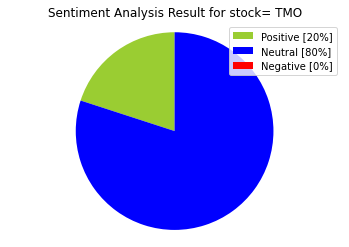

Wordcloud for TMO


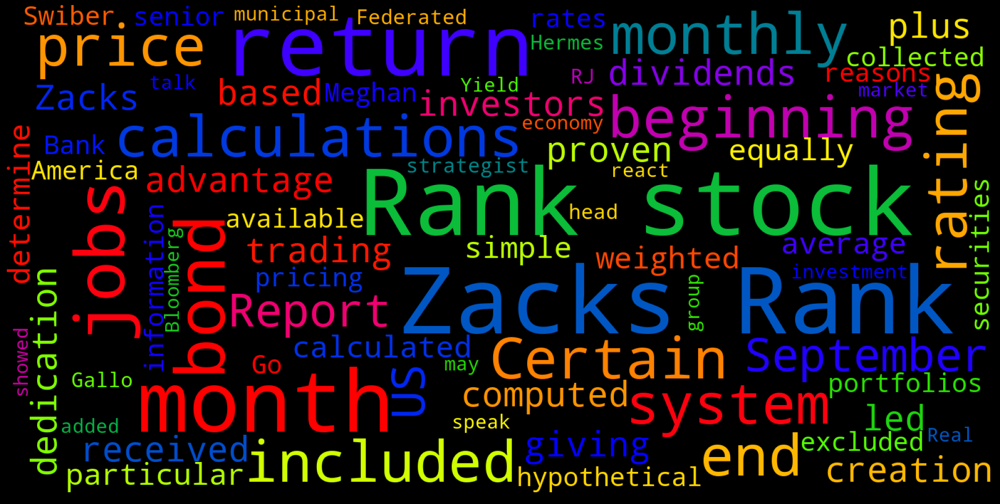

In [21]:
#Sentiment Analysis
def percentage(part,whole):
    return 100 * float(part)/float(whole)

#Assigning Initial Values
positive = 0
negative = 0
neutral = 0
#Creating empty lists
news_list = []
neutral_list = []
negative_list = []
positive_list = []

#Iterating over the tweets in the dataframe
for news in news_df['Summary']:
    news_list.append(news)
    analyzer = SentimentIntensityAnalyzer().polarity_scores(news)
    neg = analyzer['neg']
    neu = analyzer['neu']
    pos = analyzer['pos']
    comp = analyzer['compound']

    if neg > pos:
        negative_list.append(news) #appending the news that satisfies this condition
        negative += 1 #increasing the count by 1
    elif pos > neg:
        positive_list.append(news) #appending the news that satisfies this condition
        positive += 1 #increasing the count by 1
    elif pos == neg:
        neutral_list.append(news) #appending the news that satisfies this condition
        neutral += 1 #increasing the count by 1 

positive = percentage(positive, len(news_df)) #percentage is the function defined above
negative = percentage(negative, len(news_df))
neutral = percentage(neutral, len(news_df))

#Converting lists to pandas dataframe
news_list = pd.DataFrame(news_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
#using len(length) function for counting
print("Positive Sentiment:", '%.2f' % len(positive_list), end='\n')
print("Neutral Sentiment:", '%.2f' % len(neutral_list), end='\n')
print("Negative Sentiment:", '%.2f' % len(negative_list), end='\n')

#Creating PieCart
labels = ['Positive ['+str(round(positive))+'%]' , 'Neutral ['+str(round(neutral))+'%]','Negative ['+str(round(negative))+'%]']
sizes = [positive, neutral, negative]
colors = ['yellowgreen', 'blue','red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result for stock= "+company_name+"" )
plt.axis('equal')
plt.show()

# Word cloud visualization
def word_cloud(text):
    stopwords = set(STOPWORDS)
    allWords = ' '.join([nws for nws in text])
    wordCloud = WordCloud(background_color='black',width = 1600, height = 800,stopwords = stopwords,min_font_size = 20,max_font_size=150,colormap='prism').generate(allWords)
    fig, ax = plt.subplots(figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud)
    ax.axis("off")
    fig.tight_layout(pad=0)
    plt.show()

print('Wordcloud for ' + company_name)
word_cloud(news_df['Summary'].values)


In [ ]:
# import yfinance as yf

# # CREATE A TICKER INSTANCE PASSING TESLA AS THE TARGET COMPANY
# tsla = yf.Ticker('TSLA')

# # CALL THE MULTIPLE FUNCTIONS AVAILABLE AND STORE THEM IN VARIABLES.
# actions = tsla.get_actions()
# inst_holders = tsla.get_institutional_holders()
# news = tsla.get_news()


# # PRINT THE RESULTS
# print(actions)
# print('*'*20)
# print(inst_holders)
# print('*'*20)
# print(news)
# print('*'*20)